In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import io
from google.colab import files
# uploaded = files.upload()

In [ ]:
data_allstocks = pd.read_csv('/content/drive/MyDrive/all_stocks_5yr.csv')
data_allstocks.tail()

,date,open,high,low,close,volume,Name
619035,2018-02-01,76.84,78.27,76.69,77.82,2982259,ZTS
619036,2018-02-02,77.53,78.12,76.73,76.78,2595187,ZTS
619037,2018-02-05,76.64,76.92,73.18,73.83,2962031,ZTS
619038,2018-02-06,72.74,74.56,72.13,73.27,4924323,ZTS
619039,2018-02-07,72.70,75.00,72.69,73.86,4534912,ZTS


In [ ]:
data_allstocks['close']

0         14.75
1         14.46
2         14.27
3         14.66
4         13.99
          ...  
619035    77.82
619036    76.78
619037    73.83
619038    73.27
619039    73.86
Name: close, Length: 619040, dtype: float64

In [ ]:
import os

path = '/content'

directory = os.listdir(path)

print(directory)

['.config', 'drive', 'sample_data']


In [ ]:
data_allstocks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 619040 entries, 0 to 619039
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   date    619040 non-null  object 
 1   open    619029 non-null  float64
 2   high    619032 non-null  float64
 3   low     619032 non-null  float64
 4   close   619040 non-null  float64
 5   volume  619040 non-null  int64  
 6   Name    619040 non-null  object 
dtypes: float64(4), int64(1), object(2)
memory usage: 33.1+ MB


In [ ]:
# data_allstocks.isnull().sum()

data_allstocks.columns[data_allstocks.isnull().any()] 

Index(['open', 'high', 'low'], dtype='object')

In [ ]:
import os
file_directory = "/content/drive/MyDrive/individual_stocks"
listing_files = os.listdir(file_directory)

def csv_combined():
  csv_combined1 = [os.path.join(file_directory, file) 
  for file in listing_files 
    if file.endswith('.csv')]
    
  return csv_combined1   

listing_csv_final = pd.DataFrame()
listing_csv_intermediate = csv_combined()
# listing_csv_intermediate

listing_csv_temporary = pd.DataFrame()

for files in listing_csv_intermediate:
  listing_csv_temporary = pd.read_csv(files) # Reading all the .csv files in the directory
  listing_csv_temporary.index = pd.DatetimeIndex( listing_csv_temporary.date) #Definition of "Date" as index
  name =  listing_csv_temporary['Name'].iloc[0]
  listing_csv_final[name] =  listing_csv_temporary['close'] #Upload only the close value.

listing_csv_final= listing_csv_final.sort_index(axis=1)
listing_csv_final.head()#Metrics of our new DataFrame


<ipython-input-8-068d2f75c5c4>:22: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  listing_csv_final[name] =  listing_csv_temporary['close'] #Upload only the close value.


,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,XL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZION,ZTS
date,,,,,,,,,,,,,,,,,,,,,
2013-02-08,45.08,14.75,78.90,67.8542,36.25,46.89,34.41,73.31,39.12,45.70,...,28.24,37.51,88.61,42.87,31.84,27.09,65.30,75.85,24.14,33.05
2013-02-11,44.60,14.46,78.39,68.5614,35.85,46.76,34.26,73.07,38.64,46.08,...,28.31,37.46,88.28,42.84,31.96,27.46,64.55,75.65,24.21,33.26
2013-02-12,44.62,14.27,78.60,66.8428,35.42,46.96,34.30,73.37,38.89,46.27,...,28.41,37.58,88.46,42.87,31.84,27.95,64.75,75.44,24.49,33.74
2013-02-13,44.75,14.66,78.97,66.7156,35.27,46.64,34.46,73.56,38.81,46.26,...,28.42,37.80,88.67,43.08,32.00,28.26,64.41,76.00,24.74,33.55
2013-02-14,44.58,13.99,78.84,66.6556,36.57,46.77,34.70,73.13,38.61,46.54,...,28.22,38.44,88.52,42.91,32.12,28.47,63.89,76.34,24.63,33.27


In [ ]:
# Checking for any NULL values in any of the columns

listing_csv_final.columns[listing_csv_final.isnull().any()] 

Index(['ALLE', 'APTV', 'BHF', 'BHGE', 'BMY', 'CFG', 'COTY', 'CSRA', 'DHR',
       'DWDP', 'DXC', 'ES', 'EVHC', 'FOX', 'FOXA', 'FTV', 'GOOG', 'HLT', 'HPE',
       'HPQ', 'ICE', 'INFO', 'IQV', 'KHC', 'NAVI', 'NWS', 'NWSA', 'O', 'ORCL',
       'PYPL', 'QRVO', 'SYF', 'UA', 'WLTW', 'WRK'],
      dtype='object')

In [ ]:
# Filling all the NaN values using an approach called 'Forward filling'

# listing_csv_final = listing_csv_final.fillna(method = 'ffill')
# listing_csv_final.columns[listing_csv_final.isnull().any()]

In [ ]:
listing_csv_final = listing_csv_final.resample('M').last() #Selection of the last value of each month.
listing_csv_final.head()

,A,AAL,AAP,AAPL,ABBV,ABC,ABT,ACN,ADBE,ADI,...,XL,XLNX,XOM,XRAY,XRX,XYL,YUM,ZBH,ZION,ZTS
date,,,,,,,,,,,,,,,,,,,,,
2013-02-28,41.48,13.43,76.34,63.0571,36.92,47.20,33.79,74.36,39.310,45.22,...,28.64,37.27,89.55,41.42,32.44,27.50,65.48,74.96,24.15,33.45
2013-03-31,41.97,16.97,82.65,63.2371,40.78,51.45,35.32,75.97,43.515,46.49,...,30.30,38.17,90.11,42.44,34.40,27.56,71.94,75.22,24.99,33.40
2013-04-30,41.44,16.90,83.88,63.2542,46.05,54.12,36.92,81.44,45.080,43.99,...,31.14,37.91,88.99,42.35,34.32,27.75,68.12,76.45,24.62,33.02
2013-05-31,45.45,17.57,81.52,64.2478,42.69,54.08,36.67,82.11,42.910,45.93,...,31.43,40.65,90.47,41.76,35.16,28.14,67.75,78.51,28.07,32.00
2013-06-30,42.76,16.42,81.17,56.6471,41.34,55.83,34.88,71.96,45.560,45.06,...,30.32,39.61,90.35,40.96,36.28,26.94,69.34,74.94,28.92,30.89


In [ ]:
# Randomly Selecting 300 stock prices for clustering


listing_csv_final_300 = listing_csv_final[listing_csv_final.columns.to_series().sample(300)]

listing_csv_final_300

,HPE,CSRA,APA,EXR,WYN,AAL,COST,ALB,KLAC,MAA,...,BK,IDXX,LUK,REGN,KO,VZ,CCL,WLTW,ALXN,BF.B
date,,,,,,,,,,,,,,,,,,,,,
2013-02-28,NaN,NaN,74.27,37.44,60.24,13.43,101.290,65.08,54.76,69.44,...,27.14,46.060,26.90,167.000,38.72,46.53,35.77,NaN,86.74,32.810
2013-03-31,NaN,NaN,77.16,39.27,64.48,16.97,106.110,62.52,52.74,69.06,...,27.99,46.195,27.43,176.403,40.44,49.15,34.30,NaN,92.14,35.700
2013-04-30,NaN,NaN,73.88,43.58,60.08,16.90,108.430,61.25,54.25,68.73,...,28.22,43.980,30.89,215.140,42.33,53.91,34.51,NaN,98.00,35.250
2013-05-31,NaN,NaN,82.13,41.89,58.12,17.57,109.631,66.92,56.29,67.97,...,30.06,41.220,31.38,241.880,39.99,48.48,33.10,NaN,97.58,34.410
2013-06-30,NaN,NaN,83.83,41.93,57.23,16.42,110.570,62.29,55.73,67.77,...,28.05,44.845,26.22,224.880,40.11,50.34,34.29,NaN,92.24,33.775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-10-31,13.92,31.99,41.37,81.59,106.85,46.82,161.080,140.89,108.89,102.35,...,51.45,166.170,25.30,402.620,45.98,47.87,66.39,161.08,119.66,57.020
2017-11-30,13.95,28.93,41.83,85.36,112.39,50.49,184.430,134.32,102.24,102.44,...,54.74,156.410,26.31,361.860,45.77,50.89,65.64,160.80,109.81,59.800
2017-12-31,14.36,29.92,42.22,87.45,115.87,52.03,186.120,127.89,105.07,100.56,...,53.86,156.380,26.49,375.960,45.88,52.93,66.37,150.69,119.59,68.670


In [ ]:
listing_csv_final_300 = listing_csv_final_300.fillna(method = 'bfill')
listing_csv_final_300.columns[listing_csv_final_300.isnull().any()]
listing_csv_final_300

,HPE,CSRA,APA,EXR,WYN,AAL,COST,ALB,KLAC,MAA,...,BK,IDXX,LUK,REGN,KO,VZ,CCL,WLTW,ALXN,BF.B
date,,,,,,,,,,,,,,,,,,,,,
2013-02-28,14.72,31.51,74.27,37.44,60.24,13.43,101.290,65.08,54.76,69.44,...,27.14,46.060,26.90,167.000,38.72,46.53,35.77,114.47,86.74,32.810
2013-03-31,14.72,31.51,77.16,39.27,64.48,16.97,106.110,62.52,52.74,69.06,...,27.99,46.195,27.43,176.403,40.44,49.15,34.30,114.47,92.14,35.700
2013-04-30,14.72,31.51,73.88,43.58,60.08,16.90,108.430,61.25,54.25,68.73,...,28.22,43.980,30.89,215.140,42.33,53.91,34.51,114.47,98.00,35.250
2013-05-31,14.72,31.51,82.13,41.89,58.12,17.57,109.631,66.92,56.29,67.97,...,30.06,41.220,31.38,241.880,39.99,48.48,33.10,114.47,97.58,34.410
2013-06-30,14.72,31.51,83.83,41.93,57.23,16.42,110.570,62.29,55.73,67.77,...,28.05,44.845,26.22,224.880,40.11,50.34,34.29,114.47,92.24,33.775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-10-31,13.92,31.99,41.37,81.59,106.85,46.82,161.080,140.89,108.89,102.35,...,51.45,166.170,25.30,402.620,45.98,47.87,66.39,161.08,119.66,57.020
2017-11-30,13.95,28.93,41.83,85.36,112.39,50.49,184.430,134.32,102.24,102.44,...,54.74,156.410,26.31,361.860,45.77,50.89,65.64,160.80,109.81,59.800
2017-12-31,14.36,29.92,42.22,87.45,115.87,52.03,186.120,127.89,105.07,100.56,...,53.86,156.380,26.49,375.960,45.88,52.93,66.37,150.69,119.59,68.670


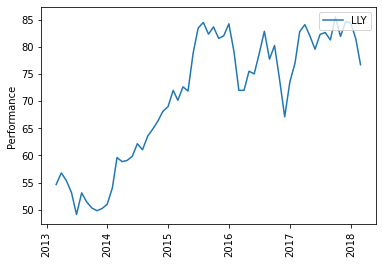

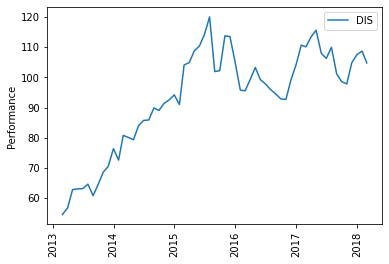

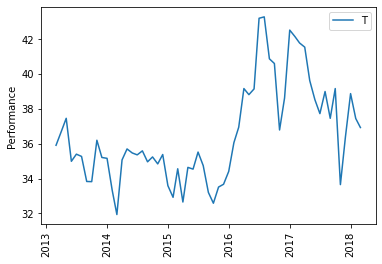

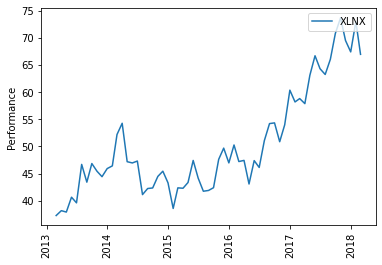

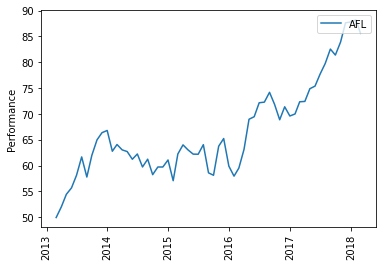

...

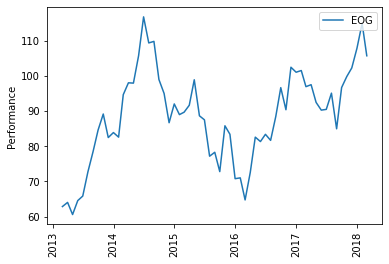

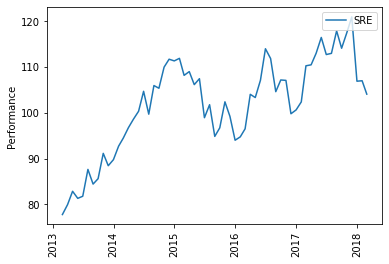

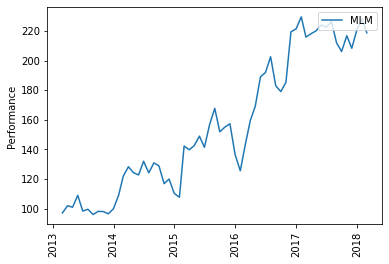

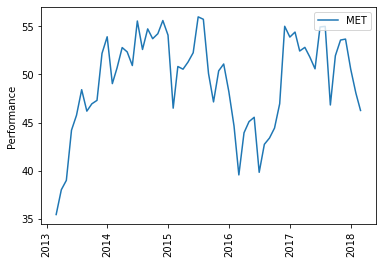

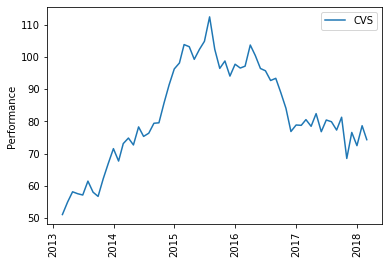

In [ ]:
for stocks in listing_csv_final_300:
    plt.plot(listing_csv_final_300[stocks], label = stocks)
    plt.xticks(rotation=90)
    plt.ylabel("Performance")
    plt.legend(loc = "upper right")
    plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler, normalize

scaler = StandardScaler()
listing_csv_final_300_scaled = scaler.fit_transform(listing_csv_final_300)
listing_csv_final_300_scaled


array([[-1.38335353, -2.29873116, -0.22780797, ..., -1.3098762 ,
        -2.84993808, -2.06935498],
       [-1.20164468, -2.16733138,  0.04855876, ..., -1.20216454,
        -2.32226987, -1.81151977],
       [-1.32193082, -1.80821159,  0.32138234, ..., -1.22485227,
        -2.12388299, -1.59898895],
       ...,
       [ 1.15886415,  0.84772894,  0.82451153, ...,  1.41948001,
         0.24244306, -0.64493206],
       [ 0.90208311,  0.91669897,  0.31783917, ...,  1.57653198,
        -0.26681812, -0.23252898],
       [ 0.49857003,  0.68422242,  0.13359468, ...,  1.37124105,
        -0.63700396, -0.5216775 ]])

In [ ]:
listing_csv_final_300_scaled_normalized = normalize(listing_csv_final_300_scaled)
listing_csv_final_300_scaled_normalized = pd.DataFrame(listing_csv_final_300_scaled_normalized)
listing_csv_final_300_scaled_normalized

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-0.055220,-0.091759,-0.009093,-0.054214,-0.073353,-0.025083,-0.069114,-0.068989,-0.054861,-0.037108,...,-0.055116,-0.081310,-0.085285,-0.011559,-0.035839,-0.077312,-0.092578,-0.052287,-0.113762,-0.082603
1,-0.052427,-0.094559,0.002119,-0.055193,-0.070230,-0.027415,-0.072151,-0.072439,-0.050840,-0.035993,...,-0.059220,-0.083752,-0.089439,-0.012634,-0.039291,-0.080630,-0.092019,-0.052449,-0.101318,-0.079035
2,-0.059510,-0.081401,0.014468,-0.058160,-0.060471,-0.028288,-0.065578,-0.077076,-0.038135,-0.037035,...,-0.063577,-0.078656,-0.086674,-0.013036,-0.059851,-0.094890,-0.082321,-0.055140,-0.095612,-0.071983
3,-0.071465,-0.084830,-0.026186,-0.047689,-0.057011,-0.029713,-0.054244,-0.067569,-0.070201,-0.037814,...,-0.062978,-0.073795,-0.082808,-0.013693,-0.034360,-0.085559,-0.093535,-0.049545,-0.049948,-0.077501
4,-0.086543,-0.083457,-0.019049,-0.052043,-0.043743,-0.029301,-0.055485,-0.066404,-0.074736,-0.037664,...,-0.062330,-0.076002,-0.084498,-0.013503,-0.057600,-0.079848,-0.090168,-0.059754,-0.034472,-0.077667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,0.037061,0.010641,-0.040386,0.094606,0.074570,0.102509,-0.048711,0.063989,0.069268,0.073178,...,0.071522,0.051647,0.024497,-0.028877,0.073828,0.033226,0.059334,0.052112,0.033772,-0.035708
57,0.041115,0.024083,-0.002146,0.069225,0.080955,0.090731,-0.028104,0.046523,0.074581,0.083497,...,0.070629,0.063296,0.036373,0.003722,0.050721,0.036079,0.064690,0.039946,0.030832,-0.013017
58,0.040639,0.029728,0.028914,0.061748,0.081618,0.066231,0.009201,0.038138,0.058516,0.096286,...,0.060449,0.058842,0.042510,-0.022648,0.065553,0.050873,0.017231,0.049778,0.008502,-0.022616
59,0.026319,0.026745,0.009273,0.068274,0.069253,0.074932,0.022567,0.046697,0.032804,0.072660,...,0.046684,0.064824,0.032260,-0.015013,0.069630,0.057877,0.014617,0.045996,-0.007785,-0.006784


In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 2)
listing_csv_final_300_scaled_normalized_PCA = pca.fit_transform(listing_csv_final_300_scaled_normalized)
listing_csv_final_300_scaled_normalized_PCA = pd.DataFrame(listing_csv_final_300_scaled_normalized_PCA)
listing_csv_final_300_scaled_normalized_PCA.columns = ['P1', 'P2']
listing_csv_final_300_scaled_normalized_PCA

,P1,P2
0,-0.715252,0.328253
1,-0.732463,0.297485
2,-0.736981,0.287158
3,-0.793120,0.225590
4,-0.785469,0.270833
...,...,...
56,0.800342,-0.522014
57,0.797426,-0.542171
58,0.766656,-0.578768
59,0.711270,-0.609839


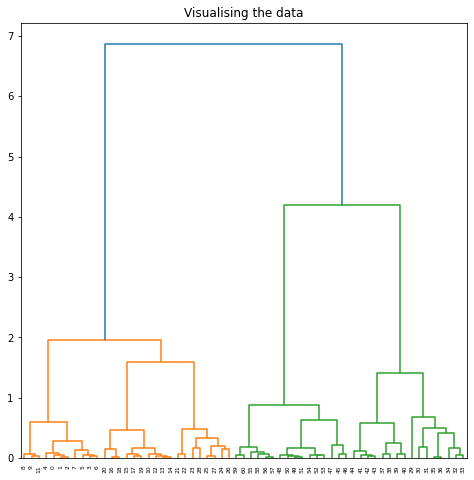

In [ ]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize =(8, 8))
plt.title('Visualising the data')
Dendrogram = shc.dendrogram((shc.linkage(listing_csv_final_300_scaled_normalized_PCA, method ='ward')))

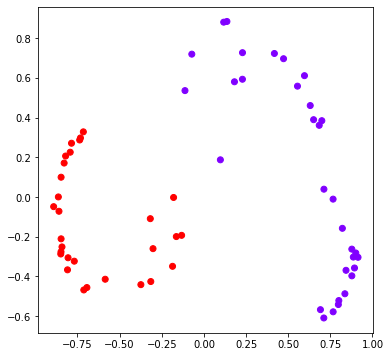

In [ ]:
from sklearn.cluster import AgglomerativeClustering

ac2 = AgglomerativeClustering(n_clusters = 2)
 
# Visualizing the clustering
plt.figure(figsize =(6, 6))
plt.scatter(listing_csv_final_300_scaled_normalized_PCA['P1'], listing_csv_final_300_scaled_normalized_PCA['P2'],
           c = ac2.fit_predict(listing_csv_final_300_scaled_normalized_PCA), cmap ='rainbow')
plt.show()

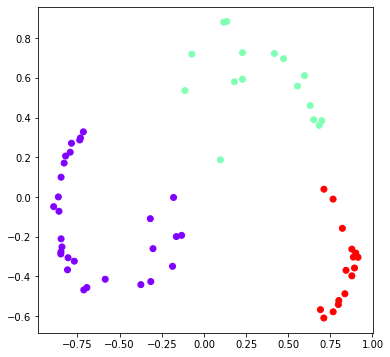

In [ ]:
ac3 = AgglomerativeClustering(n_clusters = 3)
 
plt.figure(figsize =(6, 6))
plt.scatter(listing_csv_final_300_scaled_normalized_PCA['P1'], listing_csv_final_300_scaled_normalized_PCA['P2'],
           c = ac3.fit_predict(listing_csv_final_300_scaled_normalized_PCA), cmap ='rainbow')
plt.show()

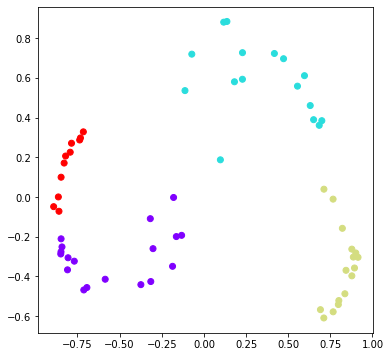

In [ ]:
ac4 = AgglomerativeClustering(n_clusters = 4)
 
plt.figure(figsize =(6, 6))
plt.scatter(listing_csv_final_300_scaled_normalized_PCA['P1'], listing_csv_final_300_scaled_normalized_PCA['P2'],
           c = ac4.fit_predict(listing_csv_final_300_scaled_normalized_PCA), cmap ='rainbow')
plt.show()

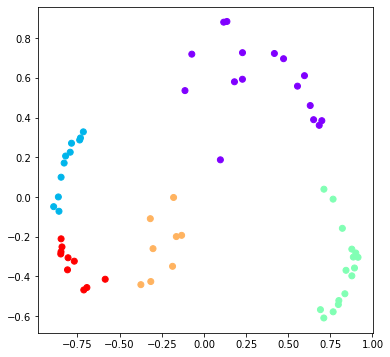

In [ ]:
ac5 = AgglomerativeClustering(n_clusters = 5)
 
plt.figure(figsize =(6, 6))
plt.scatter(listing_csv_final_300_scaled_normalized_PCA['P1'], listing_csv_final_300_scaled_normalized_PCA['P2'],
           c = ac5.fit_predict(listing_csv_final_300_scaled_normalized_PCA), cmap ='rainbow')
plt.show()

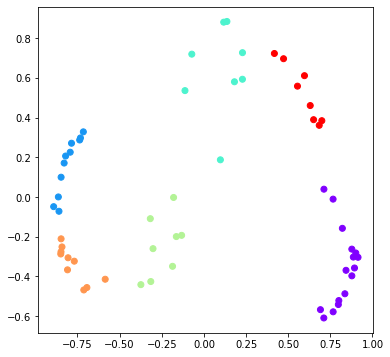

In [ ]:
ac6 = AgglomerativeClustering(n_clusters = 6)
 
plt.figure(figsize =(6, 6))
plt.scatter(listing_csv_final_300_scaled_normalized_PCA['P1'], listing_csv_final_300_scaled_normalized_PCA['P2'],
           c = ac6.fit_predict(listing_csv_final_300_scaled_normalized_PCA), cmap ='rainbow')
plt.show()

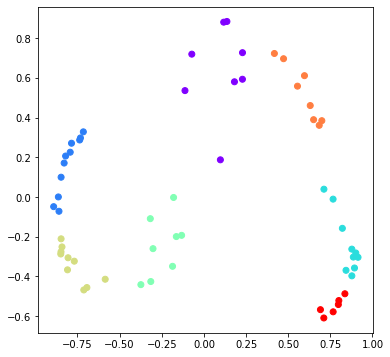

In [ ]:
ac7 = AgglomerativeClustering(n_clusters = 7)
 
plt.figure(figsize =(6, 6))
plt.scatter(listing_csv_final_300_scaled_normalized_PCA['P1'], listing_csv_final_300_scaled_normalized_PCA['P2'],
           c = ac7.fit_predict(listing_csv_final_300_scaled_normalized_PCA), cmap ='rainbow')
plt.show()

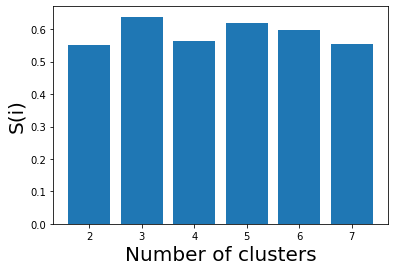

In [ ]:
from sklearn.metrics import silhouette_score

k = [2, 3, 4, 5, 6, 7]
 
# Appending the silhouette scores of the different models to the list
silhouette_scores = []
silhouette_scores.append(
        silhouette_score(listing_csv_final_300_scaled_normalized_PCA, ac2.fit_predict(listing_csv_final_300_scaled_normalized_PCA)))
silhouette_scores.append(
        silhouette_score(listing_csv_final_300_scaled_normalized_PCA, ac3.fit_predict(listing_csv_final_300_scaled_normalized_PCA)))
silhouette_scores.append(
        silhouette_score(listing_csv_final_300_scaled_normalized_PCA, ac4.fit_predict(listing_csv_final_300_scaled_normalized_PCA)))
silhouette_scores.append(
        silhouette_score(listing_csv_final_300_scaled_normalized_PCA, ac5.fit_predict(listing_csv_final_300_scaled_normalized_PCA)))
silhouette_scores.append(
        silhouette_score(listing_csv_final_300_scaled_normalized_PCA, ac6.fit_predict(listing_csv_final_300_scaled_normalized_PCA)))
silhouette_scores.append(
        silhouette_score(listing_csv_final_300_scaled_normalized_PCA, ac7.fit_predict(listing_csv_final_300_scaled_normalized_PCA)))
 
# Plotting a bar graph to compare the results
plt.bar(k, silhouette_scores)
plt.xlabel('Number of clusters', fontsize = 20)
plt.ylabel('S(i)', fontsize = 20)
plt.show()

In [ ]:
silhouette_scores

[0.5526099820259591,
 0.6385203928676547,
 0.5642523767404669,
 0.6193976512059156,
 0.598852869226268,
 0.5532041757832469]

# **FUTURE PRICE PREDICTION BASED ON LSTM MODEL**

**ARIMA Model Comparison**

In [92]:
import pandas as pd

google_data = pd.read_csv('/content/drive/MyDrive/individual_stocks/GOOGL_data.csv', index_col = "date")
google_data.head()

,open,high,low,close,volume,Name
date,,,,,,
2013-02-08,390.4551,393.7283,390.1698,393.0777,6031199,GOOGL
2013-02-11,389.5892,391.8915,387.2619,391.6012,4330781,GOOGL
2013-02-12,391.2659,394.3440,390.0747,390.7403,3714176,GOOGL
2013-02-13,390.4551,393.0677,390.3750,391.8214,2393946,GOOGL
2013-02-14,390.2549,394.7644,389.2739,394.3039,3466971,GOOGL


In [93]:
google_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1259 entries, 2013-02-08 to 2018-02-07
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   open    1259 non-null   float64
 1   high    1259 non-null   float64
 2   low     1259 non-null   float64
 3   close   1259 non-null   float64
 4   volume  1259 non-null   int64  
 5   Name    1259 non-null   object 
dtypes: float64(4), int64(1), object(1)
memory usage: 68.9+ KB


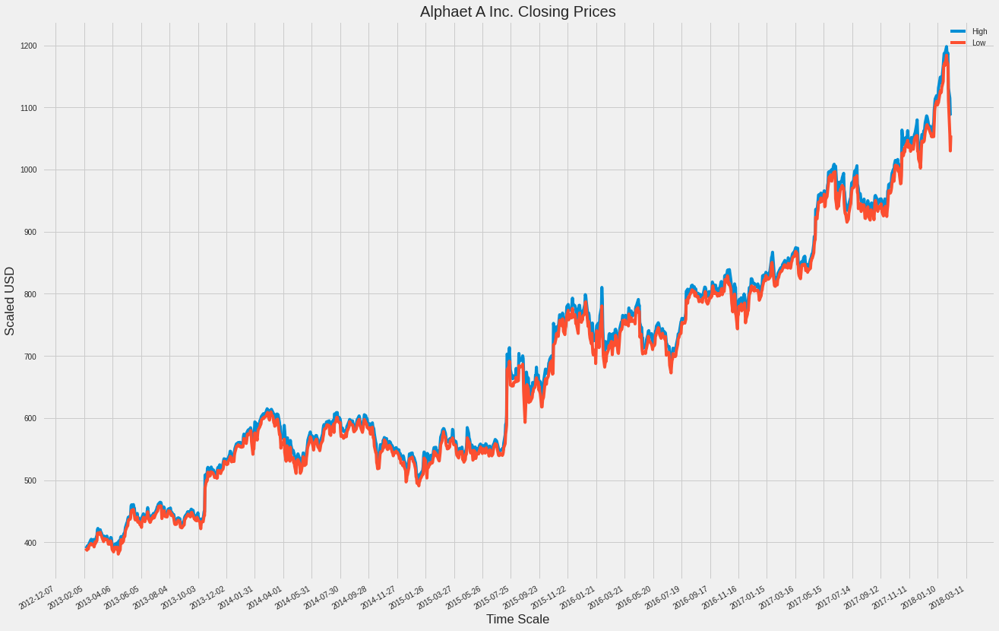

In [94]:
import matplotlib.dates as dates
import matplotlib.pyplot as plt
import datetime as datetime

plt.figure(figsize = (20, 15))
plt.gca().xaxis.set_major_formatter(dates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(dates.DayLocator(interval = 60))
x_dates = [datetime.datetime.strptime(d, '%Y-%m-%d').date() for d in google_data.index.values]

plt.plot(x_dates, google_data['high'], label = 'High')
plt.plot(x_dates, google_data['low'], label = 'Low')
plt.title('Alphaet A Inc. Closing Prices')
plt.xlabel('Time Scale')
plt.ylabel('Scaled USD')
plt.legend()
plt.gcf().autofmt_xdate()
plt.show()

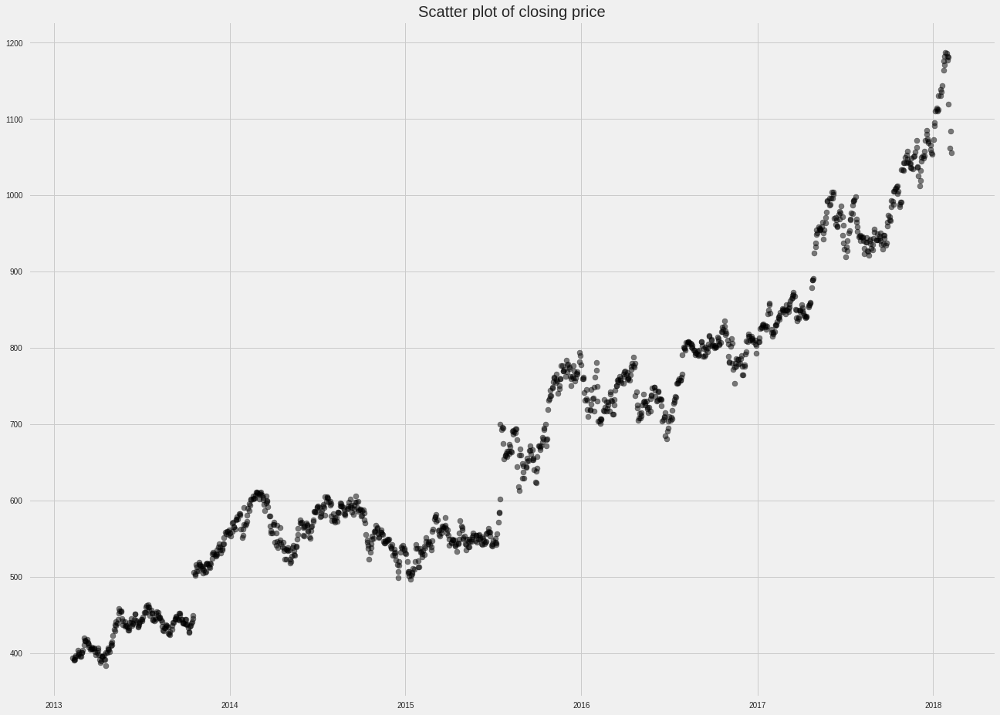

In [95]:
# Scatter Plot for the Closing prices

google_data_close = google_data['close']
# amazon_data_close.plot(style='k.')
plt.figure(figsize = (20, 15))
plt.scatter(x_dates, google_data_close, alpha = 0.5, color = 'black')
plt.title('Scatter plot of closing price')
plt.show()

In [96]:
import os
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
matplotlib.style.use('seaborn')
plt.style.use('fivethirtyeight')
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math
import numpy as np

In [97]:
from matplotlib.pylab import rcParams
from plotly.graph_objs import *
from plotly.offline import init_notebook_mode, iplot, iplot_mpl
init_notebook_mode()
from tqdm import tqdm
import statsmodels.api as sm
import warnings

In [98]:
google_data = google_data.drop(['Name'], axis = 1)
google_data

,open,high,low,close,volume
date,,,,,
2013-02-08,390.4551,393.7283,390.1698,393.0777,6031199
2013-02-11,389.5892,391.8915,387.2619,391.6012,4330781
2013-02-12,391.2659,394.3440,390.0747,390.7403,3714176
2013-02-13,390.4551,393.0677,390.3750,391.8214,2393946
2013-02-14,390.2549,394.7644,389.2739,394.3039,3466971
...,...,...,...,...,...
2018-02-01,1175.9900,1187.4500,1169.3600,1181.5900,3675709
2018-02-02,1127.4200,1131.3000,1111.1700,1119.2000,5892122
2018-02-05,1100.6100,1114.9900,1056.7400,1062.3900,4177469


# **LSTM**

In [99]:
# Imports
import numpy as np
import pandas as pd
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt

In [100]:
google_data.dropna(inplace=True)

In [101]:
google_data_close = google_data.iloc[:, 3:4]

google_data_close

,close
date,
2013-02-08,393.0777
2013-02-11,391.6012
2013-02-12,390.7403
2013-02-13,391.8214
2013-02-14,394.3039
...,...
2018-02-01,1181.5900
2018-02-02,1119.2000
2018-02-05,1062.3900


In [102]:
from sklearn.preprocessing import MinMaxScaler


#Using MinMaxScaler for normalizing data between 0 & 1
normalization = MinMaxScaler(feature_range=(0,1))
google_data_close_scaled = normalization.fit_transform(np.array(google_data_close).reshape(-1,1))

google_data_close_scaled

array([[0.01210825],
       [0.01027231],
       [0.00920184],
       ...,
       [0.84435851],
       [0.87176395],
       [0.83567929]])

In [103]:

# Train and test data size description

train_size = int(len(google_data_close_scaled)*0.70)
test_size = len(google_data_close_scaled) - train_size

train_size,test_size

(881, 378)

In [104]:
#Splitting data between train and test

google_data_close_train, google_data_close_test = google_data_close_scaled[0:train_size,:], google_data_close_scaled[train_size:len(google_data_close_scaled),:1]

len(google_data_close_train),len(google_data_close_test)

(881, 378)

In [105]:
# TIme series Data creation (in steps) for LSTM model 


def dataset_create(dataset,step):

    Xtrain, Ytrain = [], []

    for i in range(len(dataset)-step-1):
        a = dataset[i:(i+step), 0]
        Xtrain.append(a)
        Ytrain.append(dataset[i + step, 0])
    # print(Xtrain)

    return np.array(Xtrain), np.array(Ytrain)



In [106]:
time_stamp = 100
dataset_create(google_data_close_train, time_stamp)

(array([[0.01210825, 0.01027231, 0.00920184, ..., 0.07123076, 0.07590448,
         0.07243814],
        [0.01027231, 0.00920184, 0.01054612, ..., 0.07590448, 0.07243814,
         0.07500211],
        [0.00920184, 0.01054612, 0.01363296, ..., 0.07243814, 0.07500211,
         0.07939581],
        ...,
        [0.44954117, 0.45621845, 0.45662878, ..., 0.50732387, 0.5192609 ,
         0.51824128],
        [0.45621845, 0.45662878, 0.46507175, ..., 0.5192609 , 0.51824128,
         0.51674915],
        [0.45662878, 0.46507175, 0.4664644 , ..., 0.51824128, 0.51674915,
         0.5146726 ]]),
 array([0.07500211, 0.07939581, 0.08661498, 0.08670836, 0.08717515,
        0.0960435 , 0.09776118, 0.09881289, 0.0956502 , 0.09499179,
        0.09009388, 0.08133011, 0.09010631, 0.08581222, 0.08525217,
        0.07579257, 0.07433003, 0.07241315, 0.0777965 , 0.07582366,
        0.08607359, 0.08753612, 0.08655903, 0.0813127 , 0.07762839,
        0.07887929, 0.07747905, 0.07442963, 0.07177837, 0.0646588 ,
 

In [107]:
#Taking one record of 100 days for training

time_stamp = 100

X_train, y_train = dataset_create(google_data_close_train,time_stamp)
X_test, y_test = dataset_create(google_data_close_test,time_stamp)

In [108]:
X_train.shape,y_train.shape

((780, 100), (780,))

In [109]:
X_test.shape, y_test.shape

((277, 100), (277,))

In [110]:
# Fitting the inout parans into the  LSTM model through RESHAPING

X_train = X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

X_train.shape

(780, 100, 1)

In [111]:

from keras.models import Sequential
from keras.layers import Dense, LSTM

In [112]:
#Creating the LSTM model
model = Sequential()
model.add(LSTM(units=50,return_sequences=True,input_shape=(X_train.shape[1],1)))
model.add(LSTM(units=50,return_sequences=True))
model.add(LSTM(units=50))
model.add(Dense(units=1,activation='linear'))
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 100, 50)           10400     
                                                                 
 lstm_7 (LSTM)               (None, 100, 50)           20200     
                                                                 
 lstm_8 (LSTM)               (None, 50)                20200     
                                                                 
 dense_2 (Dense)             (None, 1)                 51        
                                                                 
Total params: 50,851
Trainable params: 50,851
Non-trainable params: 0
_________________________________________________________________


In [113]:
#Compiling the model with appropriate functions and FITTING the training data and Validation data

model.compile(loss='mean_squared_error',optimizer='adam')

model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=100,batch_size=64)

Epoch 1/100
13/13 [==============================] - 9s 298ms/step - loss: 0.0210 - val_loss: 0.0906
Epoch 2/100
13/13 [==============================] - 3s 200ms/step - loss: 0.0050 - val_loss: 0.0106
Epoch 3/100
13/13 [==============================] - 3s 199ms/step - loss: 0.0023 - val_loss: 0.0044
Epoch 4/100
13/13 [==============================] - 3s 201ms/step - loss: 0.0011 - val_loss: 0.0014
Epoch 5/100
13/13 [==============================] - 3s 204ms/step - loss: 9.7397e-04 - val_loss: 0.0012
Epoch 6/100
13/13 [==============================] - 3s 199ms/step - loss: 9.3271e-04 - val_loss: 0.0017
Epoch 7/100
13/13 [==============================] - 3s 200ms/step - loss: 9.1397e-04 - val_loss: 0.0019
Epoch 8/100
13/13 [==============================] - 4s 320ms/step - loss: 8.9120e-04 - val_loss: 0.0018
Epoch 9/100
13/13 [==============================] - 5s 362ms/step - loss: 9.0266e-04 - val_loss: 0.0012
Epoch 10/100
13/13 [==============================] - 3s 215ms/step - l

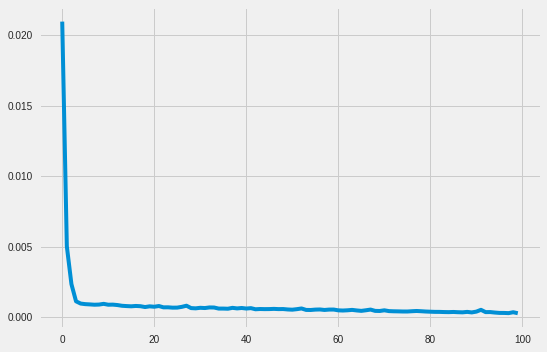

In [114]:
# Plotting the loss values for each RUN
# Shows how well the model is trained

loss_function_values = model.history.history['loss']
plt.plot(loss_function_values)


In [115]:
# Train and Test data Prediction

train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

9/9 [==============================] - 0s 38ms/step


In [116]:
#Inverse Transform done on the normalized values

train_predict = normalization.inverse_transform(train_predict)
test_predict = normalization.inverse_transform(test_predict)

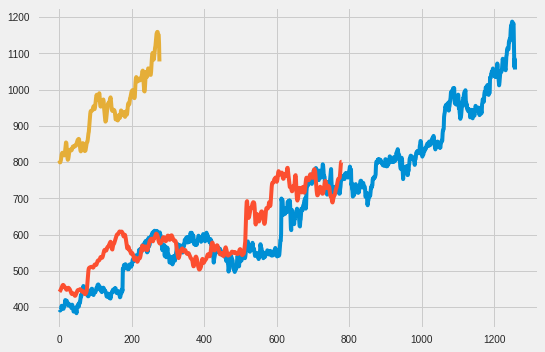

In [117]:
#Comparing using visuals
plt.figsize = (15, 20)
plt.plot(normalization.inverse_transform(google_data_close_scaled))
plt.plot(train_predict)
plt.plot(test_predict)

In [118]:
type(train_predict)

numpy.ndarray

In [119]:
test = np.vstack((train_predict,test_predict))

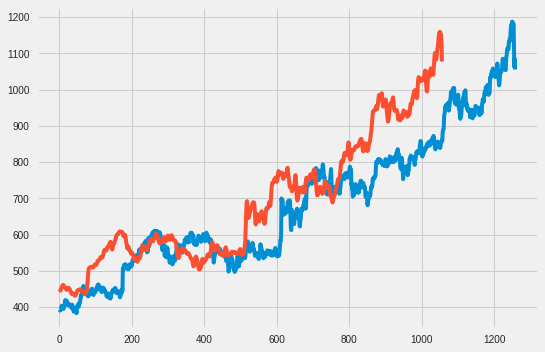

In [120]:
#Plotting the Actual and the PREDICTED values

plt.plot(normalization.inverse_transform(google_data_close_scaled))
plt.plot(test)

In [121]:
len(google_data_close_test)

378

In [122]:
#Getting the last 100 days records

fut_inp = google_data_close_test[278:]
fut_inp = fut_inp.reshape(1,-1)

In [123]:
tmp_inp = list(fut_inp)

In [124]:
fut_inp.shape

(1, 100)

In [125]:
#Creating list of the last 100 data
tmp_inp = tmp_inp[0].tolist()

In [126]:
#Predicting next 30 days price suing the current data
#It will predict in sliding window manner (algorithm) with stride 1

list_output_value = []
n_steps=100
i=0
while(i<30):
    
    if(len(tmp_inp)>100):
        fut_inp = np.array(tmp_inp[1:])
        fut_inp=fut_inp.reshape(1,-1)
        fut_inp = fut_inp.reshape((1, n_steps, 1))
        yhat = model.predict(fut_inp, verbose=0)
        tmp_inp.extend(yhat[0].tolist())
        tmp_inp = tmp_inp[1:]
        list_output_value.extend(yhat.tolist())
        i=i+1
    else:
        fut_inp = fut_inp.reshape((1, n_steps, 1))
        yhat = model.predict(fut_inp, verbose=0)
        tmp_inp.extend(yhat[0].tolist())
        list_output_value.extend(yhat.tolist())
        i=i+1
    

print(list_output_value)

[[0.8192405700683594], [0.8160173296928406], [0.819171667098999], [0.8259270787239075], [0.8331809639930725], [0.8378341197967529], [0.8373050093650818], [0.8299850821495056], [0.8155409097671509], [0.7949904799461365], [0.7704940438270569], [0.7448798418045044], [0.7210205793380737], [0.7012437582015991], [0.6869415044784546], [0.6784482598304749], [0.6751563549041748], [0.6757681369781494], [0.678597629070282], [0.6818559765815735], [0.683901846408844], [0.6834478974342346], [0.6797176599502563], [0.6725311875343323], [0.6623041033744812], [0.649943470954895], [0.6366585493087769], [0.6237218379974365], [0.6122395992279053], [0.6029813885688782]]


In [127]:
len(google_data_close_scaled)


1259

In [128]:
plot_new=np.arange(1,101)
plot_pred=np.arange(101, 131)

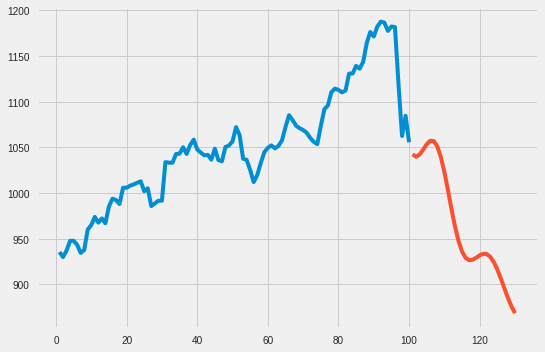

In [129]:
plt.plot(plot_new, normalization.inverse_transform(google_data_close_scaled[1159:]))
plt.plot(plot_pred, normalization.inverse_transform(list_output_value))

In [130]:
ds_new = google_data_close_scaled.tolist()


In [131]:
len(ds_new)


1259

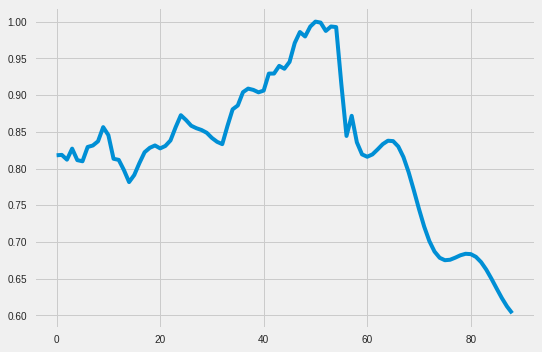

In [132]:
#Filling the MISSING values with some approximate values

ds_new.extend(list_output_value)
plt.plot(ds_new[1200:])

In [133]:
#Creating final data for plotting

final_graph = normalization.inverse_transform(ds_new).tolist()

# google_close_data[len(google_data_close) - 1: ].to_numpy()

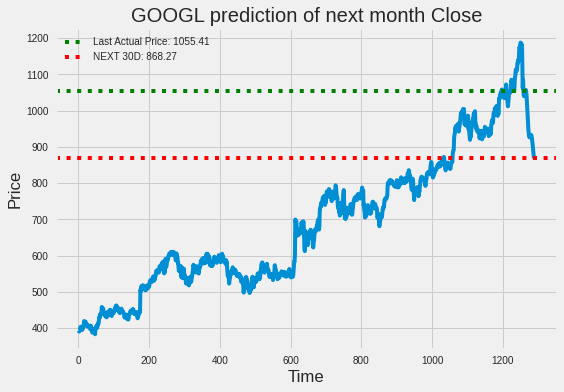

In [134]:
#Plotting final results with predicted value after 30 Days

plt.plot(final_graph,)
plt.ylabel("Price")
plt.xlabel("Time")
plt.title("GOOGL prediction of next month Close")
plt.axhline(y=google_data_close[len(google_data_close) - 1: ].values, color = 'green', linestyle = ':', label = 'Last Actual Price: {0}'.format(round(float(*google_data_close[len(google_data_close) - 1: ].to_numpy()),2)))
plt.axhline(y=final_graph[len(final_graph)-1], color = 'red', linestyle = ':', label = 'NEXT 30D: {0}'.format(round(float(*final_graph[len(final_graph)-1]),2)))
plt.legend()
